# Импорт кучи всякого

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from tqdm.auto import tqdm

# Загрузка датасета, изменение настроек отображения



In [ ]:
df_base = pd.read_csv('flats.csv', sep=',', encoding="utf-8")
pd.set_option("display.max_columns", None)
df_base

,author,author_type,link,city,kitchen_metr,living_metr,year_of_construction,deal_type,accommodation_type,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,house_number,underground,residential_complex
0,ТСН Владис,real_estate_agent,https://pushkino.cian.ru/sale/flat/292001667/,Москва,15.80,65.82,1961,sale,flat,1,2,-1,84.7,23612,2000000,NaN,Акуловское шоссе,15к2,Алтуфьево,NaN
1,ID 108451955,homeowner,https://www.cian.ru/sale/flat/293433338/,Москва,9.62,32.24,1993,sale,flat,12,12,-1,45.6,54824,2500000,Лианозово,Илимская,2,Алтуфьево,NaN
2,Градомиръ,real_estate_agent,https://www.cian.ru/sale/flat/294389672/,Москва,11.09,37.17,1977,sale,flat,3,5,2,52.5,54285,2850000,NaN,NaN,NaN,NaN,NaN
3,ГОРОБМЕН,real_estate_agent,https://dmitrov.cian.ru/sale/flat/287974126/,Москва,7.55,30.21,1994,sale,flat,1,5,1,38.1,75853,2890000,Икша рп,Садовая,11,NaN,Икша Парк
4,Сергей Пастухов,realtor,https://dmitrov.cian.ru/sale/flat/294379944/,Москва,10.17,40.61,2011,sale,flat,1,5,2,51.0,64686,3299000,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62091,Абсолют Недвижимость,developer,https://www.cian.ru/sale/flat/293669665/,Москва,10.41,48.51,1975,sale,flat,4,17,2,64.0,229973,14718322,NaN,NaN,к1,Говорово,Переделкино Ближнее Город-парк
62092,Абсолют Недвижимость,developer,https://www.cian.ru/sale/flat/293956262/,Москва,9.61,45.13,1974,sale,flat,8,17,2,60.5,262688,15892663,NaN,NaN,к2,Говорово,Переделкино Ближнее Город-парк
62093,ID 82171,realtor,https://www.cian.ru/sale/flat/278717103/,Москва,8.06,40.16,2020,sale,flat,7,8,1,51.0,395098,20150000,NaN,Татьянин Парк,12к6,Говорово,Татьянин Парк
62094,Страна Девелопмент,developer,https://www.cian.ru/sale/flat/294654989/,Москва,12.42,47.53,1984,sale,flat,12,30,3,67.7,330723,22390000,Очаково-Матвеевское,Озерная,42С7,Говорово,Страна.Озёрная


# Удаляем глупости

In [ ]:
df = df_base.drop(['author','author_type', 'link', 'deal_type', "residential_complex", "city", "accommodation_type", "house_number"], axis=1)
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground
0,15.80,65.82,1961,1,2,-1,84.7,23612,2000000,NaN,Акуловское шоссе,Алтуфьево
1,9.62,32.24,1993,12,12,-1,45.6,54824,2500000,Лианозово,Илимская,Алтуфьево
2,11.09,37.17,1977,3,5,2,52.5,54285,2850000,NaN,NaN,NaN
3,7.55,30.21,1994,1,5,1,38.1,75853,2890000,Икша рп,Садовая,NaN
4,10.17,40.61,2011,1,5,2,51.0,64686,3299000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
62091,10.41,48.51,1975,4,17,2,64.0,229973,14718322,NaN,NaN,Говорово
62092,9.61,45.13,1974,8,17,2,60.5,262688,15892663,NaN,NaN,Говорово
62093,8.06,40.16,2020,7,8,1,51.0,395098,20150000,NaN,Татьянин Парк,Говорово
62094,12.42,47.53,1984,12,30,3,67.7,330723,22390000,Очаково-Матвеевское,Озерная,Говорово


# Смотрим что по типам данных

In [ ]:
df.dtypes

kitchen_metr            float64
living_metr             float64
year_of_construction      int64
floor                     int64
floors_count              int64
rooms_count               int64
total_meters            float64
price_per_m2              int64
price                     int64
district                 object
street                   object
underground              object
dtype: object

# Смотрим как дела с NaN'ами

In [ ]:
df.isna().sum()

kitchen_metr                0
living_metr                 0
year_of_construction        0
floor                       0
floors_count                0
rooms_count                 0
total_meters                0
price_per_m2                0
price                       0
district                13364
street                   9218
underground              4200
dtype: int64

# Для более точной модели уберём квартиры, где NaN и метро, и район

In [ ]:
inds = df[["underground", "district"]].isnull().all(axis=1)
df = df.loc[~inds, :]
df.isna().sum()

kitchen_metr                0
living_metr                 0
year_of_construction        0
floor                       0
floors_count                0
rooms_count                 0
total_meters                0
price_per_m2                0
price                       0
district                11557
street                   7411
underground              2393
dtype: int64

## Ещё заметим, что в датасете не у всех квартир есть количество комнат (где-то стоит -1), посчитаем сколько таких квартир.

In [ ]:
len(df[df['rooms_count'] == -1])

3128

# Уберём квартиры, где не указаны комнаты (ПОЗЖЕ)

In [ ]:
pd.options.mode.chained_assignment = None  # разрешаем менять копию фрейма
# df["rooms_count"].replace({-1: np.nan}, inplace=True)
# df["rooms_count"] = df["rooms_count"].interpolate()
# df

# Посмотрим корреляцию параметров

# Для увеличения количества метрик добавим расстояние от метро до центра Москвы с помощью Yandex Geocode API

In [ ]:
from math import radians, cos, sin, asin, sqrt
import requests


# Функция для подсчёт расстояния между двумя координатами
def distance(lat1: float, lat2: float, lon1: float, lon2: float) -> float:
    lon1 = radians(lon1)
    lon2 = radians(lon2)
    lat1 = radians(lat1)
    lat2 = radians(lat2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / -2)**2

    c = 2 * asin(sqrt(a))

    r = 6371

    return(c * r)


# Создадим и заполним словарь, где ключ - станция, а значение - расстояние

In [ ]:
#  pd.options.mode.chained_assignment = None  # разрешаем менять копию фрейма

# # расстояния от станций метро до центра
# metro_dist = {i: 0.0 for i in df["underground"].unique() if not pd.isna(i)}
# for i, j in metro_dist.items():
#      lo, la = map(float,
#                   requests.get
#                    (f"https://geocode-maps.yandex.ru/1.x/?apikey=2eeef5bf-f451-487f-a054-d894f7a0c0e8&geocode=метро {i} москва&format=json").json()
#                    ["response"]["GeoObjectCollection"]["featureMember"][0]["GeoObject"]["Point"]['pos'].split())
#      d = distance(la, 55.755863, lo, 37.617700)
#      metro_dist[i] = d

# Чтобы не выполнять закомментированный код каждый раз, впишем получившийся словарь прямо сюда.
metro_dist = {
    'Алтуфьево': 15.940725433703157,
    'Медведково': 14.888339980712153,
    'Аминьевская': 11.57920017524417,
    'Мичуринский проспект': 11.195974455301041,
    'Раменки': 9.8658421785368,
    'Юго-Западная': 13.276995189960077,
    'Аннино': 19.243634882643338,
    'Арбатская': 1.1056372429301695,
    'Смоленская': 2.3594168467486103,
    'Кропоткинская': 1.4935300331859107,
    'Парк Культуры': 2.764025428013961,
    'Аэропорт': 7.24611857622426,
    'Красный Балтиец': 8.739207020722443,
    'Сокол': 8.444931464270718,
    'Аэропорт Внуково': 26.48888945042643,
    'Филатов Луг': 21.6492372952118,
    'Рассказовка': 22.318909380025854,
    'Саларьево': 19.22198263482266,
    'Варшавская': 11.404039063761706,
    'Тульская': 5.237677532024642,
    'Крымская': 7.365427272631539,
    'Фили': 6.522977594394992,
    'Верхние Лихоборы': 11.709020029353045,
    'Селигерская': 13.075088423743576,
    'Телецентр': 7.357168481986154,
    'Бескудниково': 14.389708885875216,
    'Владыкино': 10.384606704242255,
    'Водный стадион': 12.419607201531957,
    'Войковская': 10.265436037476501,
    'Волгоградский проспект': 5.536705770636242,
    'Волжская': 11.141912741316883,
    'Волоколамская': 17.1876324952727,
    'Трикотажная': 16.14818019049007,
    'Красногорская': 20.666499556833635,
    'Пенягино': 17.674910391882264,
    'Воробьёвы горы': 6.2346699207257545,
    'Фрунзенская': 3.936384519019297,
    'Воронцовская': 11.849647027357877,
    'Выставочная': 4.814350743309818,
    'Деловой центр': 4.912054398499269,
    'Выставочный центр': 7.697273116730071,
    'Говорово': 16.50358677528088,
    'Силикатная': 31.97532027744063,
    'Лианозово': 16.51236509441196,
    'Минская': 8.317985792999078,
    'Лубянка': 0.7041467650756428,
    'Кузнецкий мост': 0.7592272389556624,
    'Площадь Революции': 0.3317150370736872,
    'Быково': 31.895500901615872,
    'Левобережная': 0.00601792514549279,
    'Речной вокзал': 14.121229128184046,
    'Беломорская': 15.066996172242826,
    'Коптево': 11.166343687202934,
    'Ховрино': 16.076098023246814,
    'Хорошёвская': 7.280275633167577,
    'Беговая': 4.904397353384389,
    'Динамо': 5.293048747522237,
    'Ломоносовский проспект': 8.363224191423566,
    'ЦСКА': 6.288682826439649,
    'Покровское': 17.024450033298,
    'Пражская': 15.951494948580399,
    'Царицыно': 15.272980052164174,
    'Домодедовская': 17.3230213790168,
    'Цветной бульвар': 1.7776055431112199,
    'Электрозаводская': 5.9880573056125215,
    'Лефортово': 5.657756464756371,
    'Измайлово': 8.650095158240195,
    'Новокузнецкая': 1.6649498296760232,
    'Китай-город': 0.8603882324300611,
    'Мещерская': 15.576990424342691,
    'Баковка': 20.598245331625048,
    'Новослободская': 2.8254213193599753,
    'Белорусская': 3.2647539400520698,
    'Новоясеневская': 17.60168936319139,
    'Ясенево': 17.459003700979906,
    'Новые Черёмушки': 10.328022944553576,
    'Озёрная': 14.197932952754439,
    'Трубная': 1.3582655503188583,
    'Тверская': 1.205999695307335,
    'Тургеневская': 1.5832432751283243,
    'Библиотека им. Ленина': 0.693110959966417,
    'Театральная': 0.24771165797640174,
    'Тушинская': 13.762506493332763,
    'Тёплый Стан': 16.697062223585203,
    'Тропарёво': 15.246291560051471,
    'Коньково': 14.981289511560206,
    'Беляево': 13.832484517652857,
    'Преображенская площадь': 7.558742583750415,
    'Раменское': 43.610324837736535,
    'Котельники': 17.616768163119577,
    'Выхино': 13.31695711879642,
    'Томилино': 23.811875194015006,
    'Красногвардейская': 17.681691456909135,
    'Красносельская': 4.0383846355244,
    'Гражданская': 6.82987984120659,
    'Щербинка': 27.54212740830725,
    'Очаково': 13.227125085453451,
    'Сортировочная': 6.494936832101074,
    'Толстопальцево': 31.73609714355816,
    'Петровско-Разумовская': 9.151487809620958,
    'Окружная': 10.335349734507046,
    'Грачёвская': 14.422124538645793,
    'Филёвский парк': 8.603650663707882,
    'Проспект Мира': 3.0337432719327024,
    'Рижская': 4.3545229442367095,
    'Площадь трёх вокзалов': 3.212162748160133,
    'Достоевская': 2.856734297002067,
    'Менделеевская': 3.1140406358631676,
    'Профсоюзная': 9.321346390681118,
    'Проспект Вернадского': 11.176108013920231,
    'Пушкинская': 1.3980552448730132,
    'Пыхтино': 24.881358427653865,
    'Пятницкое шоссе': 19.87876918986603,
    'Химки': 18.522688883170222,
    'Новохохловская': 7.136295529612172,
    'Текстильщики': 8.757552676286915,
    'Октябрьская': 2.9906110140202835,
    'Курская': 2.585383938620912,
    'Ольховая': 23.039883138343402,
    'Коммунарка': 23.693796796136272,
    'Митино': 18.839703251241115,
    'Калитники': 5.801123617205803,
    'Орехово': 16.620171445099977,
    'Отрадное': 11.963971439152951,
    'Свиблово': 11.257037764823815,
    'Павелецкая': 2.933788660705632,
    'Парк Победы': 6.70352822975327,
    'Партизанская': 9.03306736646336,
    'Первомайская': 12.154705514662242,
    'Ильинская': 34.10351350387452,
    'Лермонтовский проспект': 15.88082864850733,
    'Плющево': 10.226242957625308,
    'Нахимовский проспект': 10.410063654761668,
    'Каширская': 11.43023888004555,
    'Новаторская': 11.284191075761726,
    'Кусково': 11.21978969713746,
    'Перово': 10.598968182543356,
    'Новокосино': 15.463599249214507,
    'Новогиреево': 12.490496848397688,
    'Технопарк': 7.482424287503264,
    'Тимирязевская': 7.473569520227529,
    'Дмитровская': 6.187872135206855,
    'Кутузовская': 5.503806458144194,
    'Киевская': 3.5354120312192,
    'Багратионовская': 7.61854708496302,
    'Кунцевская': 11.132106844142038,
    'Третьяковская': 1.6971837014236604,
    'Улица Академика Янгеля': 17.885714756109262,
    'Южная': 14.86401706403404,
    'Улица Горчакова': 24.394387682630015,
    'Улица Дмитриевского': 17.128916693194736,
    'Некрасовка': 20.3022403937778,
    'Улица Милашенкова': 7.52473585924239,
    'Зорге': 8.004984522912281,
    'Сокольники': 5.420408454632606,
    'Белокаменная': 9.736915487044264,
    'Солнцево': 18.496329920455157,
    'Спортивная': 4.933144505708911,
    'Сретенский бульвар': 1.6856623912100617,
    'Чкаловская': 2.5220216635083537,
    'Чеховская': 1.2598437360027104,
    'Охотный ряд': 0.18347309252458466,
    'Чертановская': 12.835467699948575,
    'Севастопольская': 11.603230258287017,
    'Каховская': 11.526556345092994,
    'Таганская': 2.8564981459748777,
    'Красные ворота': 2.432453977962314,
    'Комсомольская': 3.1978225033686707,
    'Шаболовская': 4.1640168414079035,
    'Ленинский проспект': 5.781552649994509,
    'Добрынинская': 3.0041303612522032,
    'Шелепиха': 5.859782825187717,
    'Молодёжная': 12.694302545430153,
    'Крылатское': 13.11285923120015,
    'Пионерская': 9.682022547331645,
    'Мякинино': 16.42965257925943,
    'Строгино': 14.434229706363833,
    'Нагатинская': 8.064915170694507,
    'Нагорная': 9.259015470645476,
    'Народное Ополчение': 8.584424970639049,
    'Хорошёво': 7.280275633167577,
    'Щукинская': 11.28410502586964,
    'ЗИЛ': 6.660524788835518,
    'Зюзино': 11.472017096622823,
    'Измайловская': 10.842002678561162,
    'Щёлковская': 12.798274674992008,
    'Калужская': 12.053122278229457,
    'Авиамоторная': 6.248679964850883,
    'Полянка': 2.109064189498833,
    'Полежаевская': 6.605902201258463,
    'Краснопресненская': 2.57859536816747,
    'Октябрьское поле': 8.837425832827332,
    'Битца': 20.539637298845697,
    'Марьина Роща': 4.526920612599878,
    'Савёловская': 4.558067181410505,
    'Петровский Парк': 5.5073970928874205,
    'Дубровка': 5.576273659106861,
    'Кожуховская': 6.944197004052155,
    'Косино': 15.746590137099778,
    'Курьяново': 12.90253012675385,
    'Марксистская': 2.8902576082241946,
    'Марьино': 14.16309863451397,
    'Люблино': 12.689908140633452,
    'Маяковская': 2.112433606525645,
    'Чистые пруды': 1.6465446682219809,
    'Физтех': 18.950848225457083,
    'Новодачная': 19.55993724798311,
    'Прокшино': 22.10575071117511,
    'Стахановская': 9.0051319319334,
    'Студенческая': 4.733489031085007,
    'Апрелевка': 41.374886302310735,
    'Новопеределкино': 20.91937566448151,
    'Санино': 35.63646863603399,
    'Бунинская аллея': 25.05610824613006,
    'Подольск': 36.201796043526606,
    'Кузьминки': 10.853778393011858,
    'Сухаревская': 2.0629742515902962,
    'Сходненская': 15.321926044629425,
    'Молжаниново': 23.83547448180807,
    'Академическая': 8.076479164496195,
    'Александровский сад': 0.6461077506456978,
    'Алексеевская': 5.923592539505839,
    'Автозаводская': 5.95255377637026,
    'Бабушкинская': 12.96237092471798,
    'Баррикадная': 2.34437818990264,
    'Улица 1905 года': 3.658583072246142,
    'Бауманская': 4.255916130090015,
    'Бибирево': 14.263572613691371,
    'Битцевский парк': 17.719378845704743,
    'Борисово': 15.742093522323765,
    'Боровицкая': 0.8162780569635936,
    'Боровское шоссе': 19.630602635237445,
    'Переделкино': 20.91937566448151,
    'Ботанический сад': 9.98044764299353,
    'Братиславская': 13.562097861353179,
    'Перерва': 12.20625648074909,
    'Бульвар Адмирала Ушакова': 23.87798543874111,
    'Бульвар Дмитрия Донского': 20.857453039352247,
    'Бульвар Рокоссовского': 9.780909456373086,
    'Бутырская': 6.468201279167287,
    'ВДНХ': 7.399067080089139,
    'Пролетарская': 4.054119352898526,
    'Окская': 11.045955837962113,
    'Рязанский проспект': 11.811692458623602,
    'Павшино': 18.48869073948816,
    'Семёновская': 7.051560280440396,
    'Серпуховская': 3.2104299341518985,
    'Славянский бульвар': 9.661250701329367,
    'Рабочий посёлок': 12.914803575903061,
    'Матвеевская': 10.248700132252516,
    "Зябликово": 24.1,
    "Дегунино": 17.5,
    "Планерная": 21.6,
    "Румянцево": 20.5,
    "Соколиная гора": 12.7,
    "Яхромская": 18.5,
    "Шипиловская": 21.8,
    "Красный Строитель": 19.8,
    "Мичуринец": 31.0,
    "Университет": 11.2,
    "Стрешнево": 13.6,
    "Моссельмаш": 18.5
}

# Уберём квартиры без метро

In [ ]:
# # расстояния от районов до центра
# district_dist = {i: 0.0 for i in df["district"].unique() if not pd.isna(i)}
# for i, j in district_dist.items():
#     try:
#         lo, la = map(float, requests.get(f"https://geocode-maps.yandex.ru/1.x/?apikey=e28e8807-9870-4b03-8461-20d60bdd95d3&geocode=район {i} москва&format=json").json()["response"]["GeoObjectCollection"]["featureMember"][0]["GeoObject"]["Point"]['pos'].split())
#     except IndexError:
#         requests.get(f"https://geocode-maps.yandex.ru/1.x/?apikey=e28e8807-9870-4b03-8461-20d60bdd95d3&geocode=район {i} москва&format=json").json()
#         break
#     d = distance(la, 55.755863, lo, 37.617700)
#     district_dist[i] = d
# district_dist

df = df[df['underground'].notna()]
df.isna().sum()

kitchen_metr                0
living_metr                 0
year_of_construction        0
floor                       0
floors_count                0
rooms_count                 0
total_meters                0
price_per_m2                0
price                       0
district                11557
street                   7411
underground                 0
dtype: int64

# Создадим новую колонку distance_to_centre и занесём в неё расстояние от метро до центра

In [ ]:
df['distance_to_centre'] = 0.0
for i, j in df.iterrows():
    try:
        df["distance_to_centre"][i] = metro_dist[j["underground"]]
    except KeyError:
        print(i, j)
        break
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,2000000,NaN,Акуловское шоссе,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,2500000,Лианозово,Илимская,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,3400000,NaN,Архитектора В.В. Белоброва,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,3500000,NaN,бульвар Тенистый,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,3500000,NaN,бульвар Имени Умберто Нобиле,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,12500000,Солнцево,Матросова,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,14718322,NaN,NaN,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,15892663,NaN,NaN,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,20150000,NaN,Татьянин Парк,Говорово,16.503587


# Проверим, что у каждой квартиры есть расстояние

In [ ]:
print(df.isna().sum())
print("-----------------")
print(df[df["distance_to_centre"] == 0.0])

kitchen_metr                0
living_metr                 0
year_of_construction        0
floor                       0
floors_count                0
rooms_count                 0
total_meters                0
price_per_m2                0
price                       0
district                11557
street                   7411
underground                 0
distance_to_centre          0
dtype: int64
-----------------
Empty DataFrame
Columns: [kitchen_metr, living_metr, year_of_construction, floor, floors_count, rooms_count, total_meters, price_per_m2, price, district, street, underground, distance_to_centre]
Index: []


# Прологарифмируем цену и посмотрим корреляцию после введения нового параметра, логарифмирование цены позволяет снизить влияние выбросов

<ipython-input-49-8187828bc74c>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr(method='pearson')


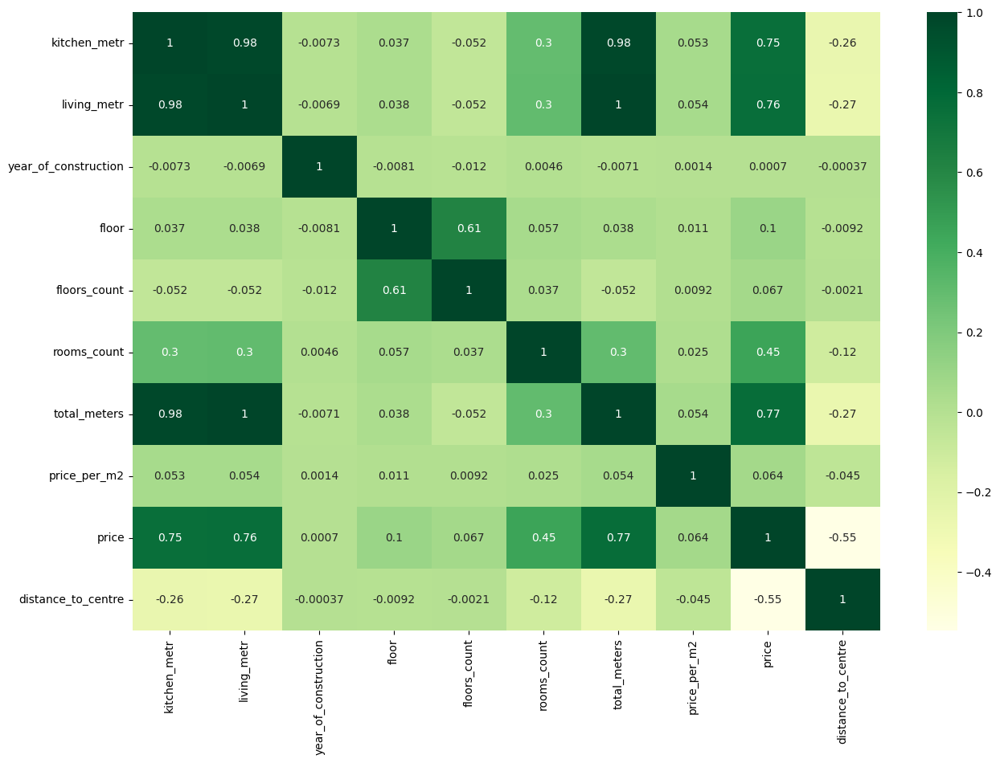

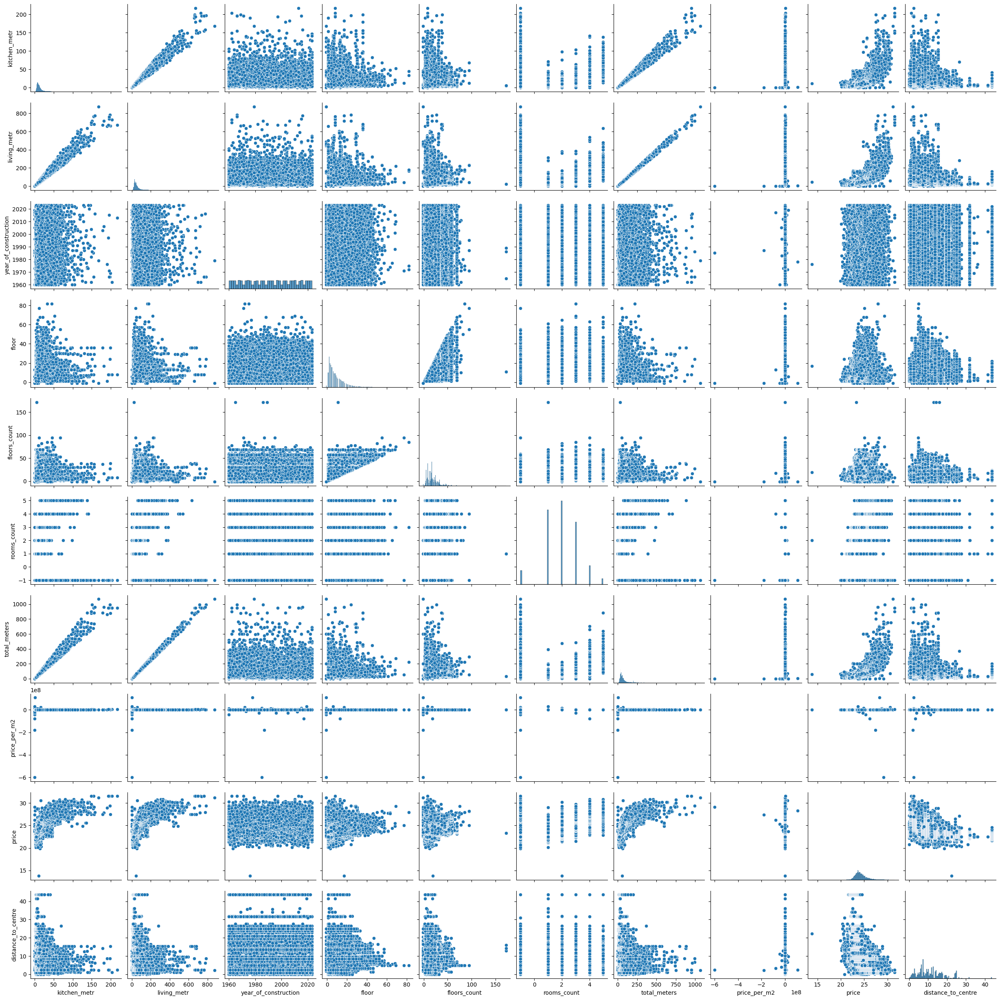

In [ ]:
df["price"] = np.log2(df['price'])
corr = df.corr(method='pearson')
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot=True, cmap='YlGn')
sns.pairplot(df)

<Axes: xlabel='distance_to_centre', ylabel='price'>

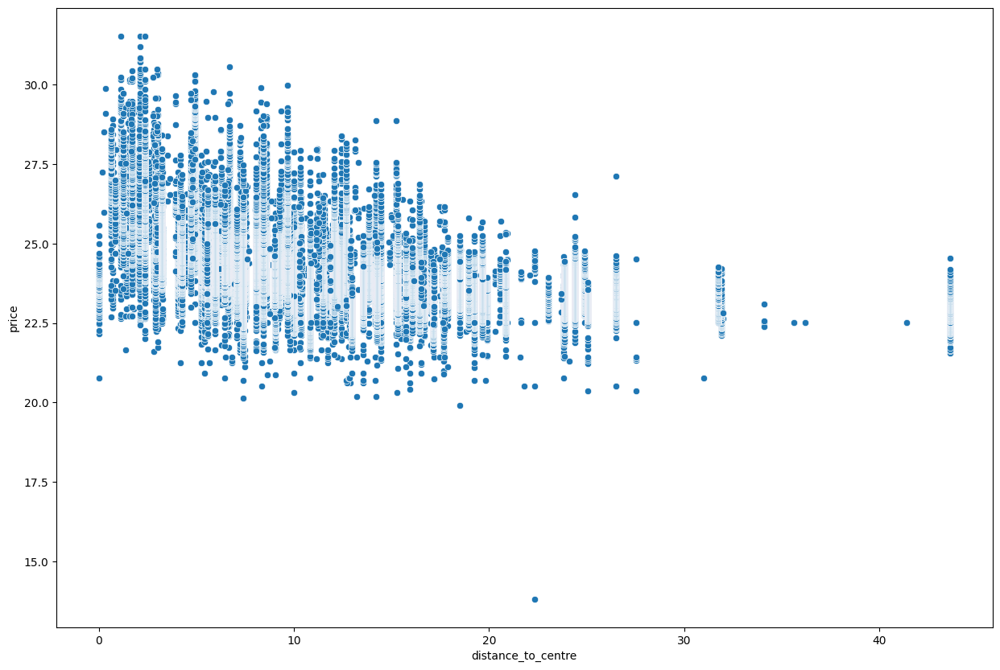

In [ ]:
plt.figure(figsize=(15,10))
sns.scatterplot(x=df.distance_to_centre, y=df.price)

# Видим, что некоторые точки очень сильно выбивается из графиков. Найдём и уберём их

<Figure size 1500x1000 with 0 Axes>

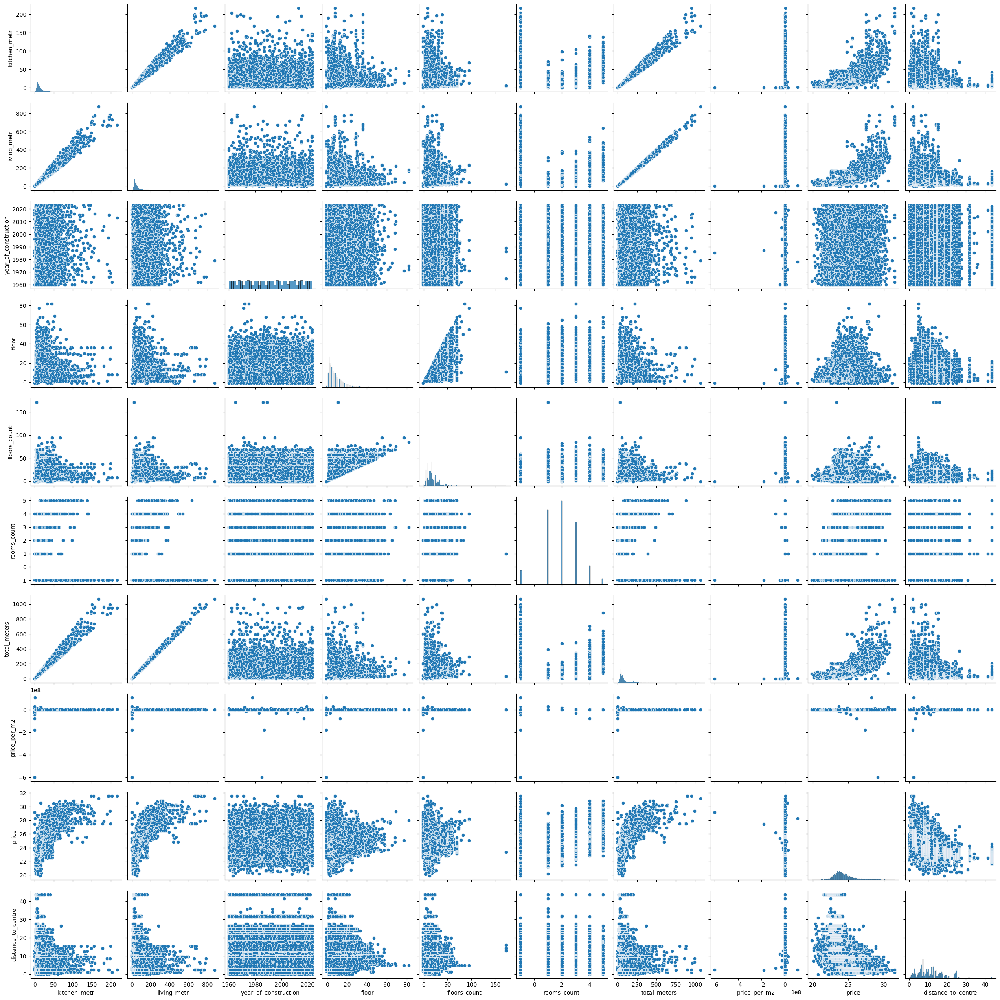

In [ ]:
df = df[df.price > 15.0]
plt.figure(figsize=(15,10))
sns.pairplot(df)

# ПЕРЕВЕДЁМ РАЙОНЫ В ЧИСЛА

In [ ]:
from sklearn import preprocessing

label_encoder = preprocessing.LabelEncoder()

label_encoder.fit(df["district"])
disctrict_name_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
df['district'] = label_encoder.transform(df['district'])

df.head()

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,20.931569,142,Акуловское шоссе,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,21.253497,52,Илимская,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,142,Архитектора В.В. Белоброва,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,21.738923,142,бульвар Тенистый,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,21.738923,142,бульвар Имени Умберто Нобиле,Алтуфьево,15.940725


In [ ]:
disctrict_name_mapping

{'3 станции метро Некрасовка': 0,
 'Академический': 1,
 'Алексеевский': 2,
 'Алтуфьевский': 3,
 'Арбат': 4,
 'Аэропорт': 5,
 'Бабушкинский': 6,
 'Басманный': 7,
 'Беговой': 8,
 'Бескудниковский': 9,
 'Бибирево': 10,
 'Бирюлево Восточное': 11,
 'Бирюлево Западное': 12,
 'Богородское': 13,
 'Братеево': 14,
 'Бутырский': 15,
 'Вешняки': 16,
 'Внуково': 17,
 'Войковский': 18,
 'Восточное Дегунино': 19,
 'Восточное Измайлово': 20,
 'Восточный': 21,
 'Выхино-Жулебино': 22,
 'Гагаринский': 23,
 'Головинский': 24,
 'Гольяново': 25,
 'Даниловский': 26,
 'Дмитровский': 27,
 'Донской': 28,
 'Дорогомилово': 29,
 'Залинейный': 30,
 'Замоскворечье': 31,
 'Западное Дегунино': 32,
 'Западный': 33,
 'Зюзино': 34,
 'Зябликово': 35,
 'Ивановское': 36,
 'Измайлово': 37,
 'Капотня': 38,
 'Коньково': 39,
 'Коптево': 40,
 'Косино-Ухтомский': 41,
 'Котельники': 42,
 'Котловка': 43,
 'Красносельский': 44,
 'Крылатское': 45,
 'Крюково': 46,
 'Кузьминки': 47,
 'Кунцево': 48,
 'Куркино': 49,
 'Левобережный': 50,


In [ ]:
for i in range(131, 141 + 1):
    df = df[df.district != i]
df = df[df.district != 0]
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,20.931569,142,Акуловское шоссе,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,21.253497,52,Илимская,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,142,Архитектора В.В. Белоброва,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,21.738923,142,бульвар Тенистый,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,21.738923,142,бульвар Имени Умберто Нобиле,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,23.575425,102,Матросова,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,23.811110,142,NaN,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,23.921858,142,NaN,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,24.264277,142,Татьянин Парк,Говорово,16.503587


In [ ]:
len(df[df['district'] == 142])

11556

In [ ]:
df["district"].replace({142: np.nan}, inplace=True)
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,20.931569,NaN,Акуловское шоссе,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,21.253497,52.0,Илимская,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,NaN,Архитектора В.В. Белоброва,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,21.738923,NaN,бульвар Тенистый,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,21.738923,NaN,бульвар Имени Умберто Нобиле,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,23.575425,102.0,Матросова,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,23.811110,NaN,NaN,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,23.921858,NaN,NaN,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,24.264277,NaN,Татьянин Парк,Говорово,16.503587


In [ ]:
df["district"].interpolate(inplace=True)
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,20.931569,NaN,Акуловское шоссе,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,21.253497,52.000000,Илимская,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,48.769231,Архитектора В.В. Белоброва,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,21.738923,45.538462,бульвар Тенистый,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,21.738923,42.307692,бульвар Имени Умберто Нобиле,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,23.575425,102.000000,Матросова,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,23.811110,96.500000,NaN,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,23.921858,91.000000,NaN,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,24.264277,85.500000,Татьянин Парк,Говорово,16.503587


In [ ]:
df["district"].iloc[0] = 52.0
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,20.931569,52.000000,Акуловское шоссе,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,21.253497,52.000000,Илимская,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,48.769231,Архитектора В.В. Белоброва,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,21.738923,45.538462,бульвар Тенистый,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,21.738923,42.307692,бульвар Имени Умберто Нобиле,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,23.575425,102.000000,Матросова,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,23.811110,96.500000,NaN,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,23.921858,91.000000,NaN,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,24.264277,85.500000,Татьянин Парк,Говорово,16.503587


In [ ]:
df["district"] = df["district"].round(0).astype(int)
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,20.931569,52,Акуловское шоссе,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,21.253497,52,Илимская,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,49,Архитектора В.В. Белоброва,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,21.738923,46,бульвар Тенистый,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,21.738923,42,бульвар Имени Умберто Нобиле,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,23.575425,102,Матросова,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,23.811110,96,NaN,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,23.921858,91,NaN,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,24.264277,86,Татьянин Парк,Говорово,16.503587


In [ ]:
print(df.dtypes)
print("-----------")
print(df.isna().sum())

kitchen_metr            float64
living_metr             float64
year_of_construction      int64
floor                     int64
floors_count              int64
rooms_count               int64
total_meters            float64
price_per_m2              int64
price                   float64
district                  int64
street                   object
underground              object
distance_to_centre      float64
dtype: object
-----------
kitchen_metr               0
living_metr                0
year_of_construction       0
floor                      0
floors_count               0
rooms_count                0
total_meters               0
price_per_m2               0
price                      0
district                   0
street                  7411
underground                0
distance_to_centre         0
dtype: int64


# То же, что и с районами, делаем с метро

In [ ]:
label_encoder = preprocessing.LabelEncoder()
label_encoder.fit(df["street"])
street_name_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
df['street'] = label_encoder.transform(df['street'])
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,20.931569,52,1138,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,21.253497,52,1454,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,49,118,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,21.738923,46,2262,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,21.738923,42,2246,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,23.575425,102,550,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,23.811110,96,2476,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,23.921858,91,2476,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,24.264277,86,805,Говорово,16.503587


In [ ]:
street_name_mapping

{' 1 Мая': 0,
 ' 1-я Бухвостова': 1,
 ' 1-я Ватутинская': 2,
 ' 1-я Вокзальная': 3,
 ' 1-я Изумрудная': 4,
 ' 1-я Крестьянская': 5,
 ' 1-я Леонова': 6,
 ' 1-я Лесные Поляны': 7,
 ' 1-я Машиностроения': 8,
 ' 1-я Нововатутинская': 9,
 ' 1-я Пролетарская': 10,
 ' 1-я Ревсобраний': 11,
 ' 1-я Рыбная': 12,
 ' 1-я Фабричная': 13,
 ' 1-я Ямского Поля': 14,
 ' 10-летия Октября': 15,
 ' 10-я Соколиной Горы': 16,
 ' 1812 года': 17,
 ' 1905 года': 18,
 ' 2-я Бухвостова': 19,
 ' 2-я Ватутинская': 20,
 ' 2-я Домбровская': 21,
 ' 2-я Институтская': 22,
 ' 2-я Комсомольская': 23,
 ' 2-я Марьиной рощи': 24,
 ' 2-я Машиностроения': 25,
 ' 2-я Нововатутинская': 26,
 ' 2-я Новорублевская': 27,
 ' 2-я Рейсовая': 28,
 ' 2-я Самаринская': 29,
 ' 2-я Синичкина': 30,
 ' 2-я Сокольническая': 31,
 ' 26 Бакинских Комиссаров': 32,
 ' 3-я Крестьянская': 33,
 ' 3-я Марьиной рощи': 34,
 ' 3-я Нововатутинская': 35,
 ' 3-я Парковая': 36,
 ' 3-я Рейсовая': 37,
 ' 3-я Соколиной Горы': 38,
 ' 3-я Сокольническая': 39,
 '

In [ ]:
len(df[df['street'] == 2476])

7411

In [ ]:
df["street"].replace({2476: np.nan}, inplace=True)
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,20.931569,52,1138.0,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,21.253497,52,1454.0,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,49,118.0,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,21.738923,46,2262.0,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,21.738923,42,2246.0,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,23.575425,102,550.0,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,23.811110,96,NaN,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,23.921858,91,NaN,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,24.264277,86,805.0,Говорово,16.503587


In [ ]:
df["street"].interpolate(inplace=True)
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,20.931569,52,1138.0,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,21.253497,52,1454.0,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,49,118.0,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,21.738923,46,2262.0,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,21.738923,42,2246.0,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,23.575425,102,550.0,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,23.811110,96,635.0,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,23.921858,91,720.0,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,24.264277,86,805.0,Говорово,16.503587


In [ ]:
df["street"] = df["street"].round(0).astype(int)
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,-1,84.7,23612,20.931569,52,1138,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,-1,45.6,54824,21.253497,52,1454,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,49,118,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,-1,13.5,259259,21.738923,46,2262,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,-1,42.7,81967,21.738923,42,2246,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,23.575425,102,550,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,23.811110,96,635,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,23.921858,91,720,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,24.264277,86,805,Говорово,16.503587


In [ ]:
print(df.dtypes)
print("-----------")
print(df.isna().sum())

kitchen_metr            float64
living_metr             float64
year_of_construction      int64
floor                     int64
floors_count              int64
rooms_count               int64
total_meters            float64
price_per_m2              int64
price                   float64
district                  int64
street                    int64
underground              object
distance_to_centre      float64
dtype: object
-----------
kitchen_metr            0
living_metr             0
year_of_construction    0
floor                   0
floors_count            0
rooms_count             0
total_meters            0
price_per_m2            0
price                   0
district                0
street                  0
underground             0
distance_to_centre      0
dtype: int64


# То же самое с комнатами

In [ ]:
# pd.options.mode.chained_assignment = None  # разрешаем менять копию фрейма
df["rooms_count"].replace({-1: np.nan}, inplace=True)
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,NaN,84.7,23612,20.931569,52,1138,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,NaN,45.6,54824,21.253497,52,1454,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2.0,51.1,66536,21.697103,49,118,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,NaN,13.5,259259,21.738923,46,2262,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,NaN,42.7,81967,21.738923,42,2246,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2.0,52.4,238549,23.575425,102,550,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2.0,64.0,229973,23.811110,96,635,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2.0,60.5,262688,23.921858,91,720,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1.0,51.0,395098,24.264277,86,805,Говорово,16.503587


In [ ]:
df["rooms_count"].interpolate(inplace=True)
df["rooms_count"][0] = 2.0
df["rooms_count"][1] = 1.0
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,2.000000,84.7,23612,20.931569,52,1138,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,1.000000,45.6,54824,21.253497,52,1454,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2.000000,51.1,66536,21.697103,49,118,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,1.666667,13.5,259259,21.738923,46,2262,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,1.333333,42.7,81967,21.738923,42,2246,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2.000000,52.4,238549,23.575425,102,550,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2.000000,64.0,229973,23.811110,96,635,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2.000000,60.5,262688,23.921858,91,720,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1.000000,51.0,395098,24.264277,86,805,Говорово,16.503587


In [ ]:
df["rooms_count"] = df["rooms_count"].round(0).astype(int)
df

,kitchen_metr,living_metr,year_of_construction,floor,floors_count,rooms_count,total_meters,price_per_m2,price,district,street,underground,distance_to_centre
0,15.80,65.82,1961,1,2,2,84.7,23612,20.931569,52,1138,Алтуфьево,15.940725
1,9.62,32.24,1993,12,12,1,45.6,54824,21.253497,52,1454,Алтуфьево,15.940725
5,10.51,39.31,1992,15,15,2,51.1,66536,21.697103,49,118,Алтуфьево,15.940725
6,2.68,10.93,1984,1,7,2,13.5,259259,21.738923,46,2262,Алтуфьево,15.940725
9,8.76,34.82,1987,12,23,1,42.7,81967,21.738923,42,2246,Алтуфьево,15.940725
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62090,9.29,40.09,1961,1,5,2,52.4,238549,23.575425,102,550,Говорово,16.503587
62091,10.41,48.51,1975,4,17,2,64.0,229973,23.811110,96,635,Говорово,16.503587
62092,9.61,45.13,1974,8,17,2,60.5,262688,23.921858,91,720,Говорово,16.503587
62093,8.06,40.16,2020,7,8,1,51.0,395098,24.264277,86,805,Говорово,16.503587


In [ ]:
print(df.dtypes)
print("-----------")
print(df.isna().sum())

kitchen_metr            float64
living_metr             float64
year_of_construction      int64
floor                     int64
floors_count              int64
rooms_count               int64
total_meters            float64
price_per_m2              int64
price                   float64
district                  int64
street                    int64
underground              object
distance_to_centre      float64
dtype: object
-----------
kitchen_metr            0
living_metr             0
year_of_construction    0
floor                   0
floors_count            0
rooms_count             0
total_meters            0
price_per_m2            0
price                   0
district                0
street                  0
underground             0
distance_to_centre      0
dtype: int64


# Распределение комнат в квартирах

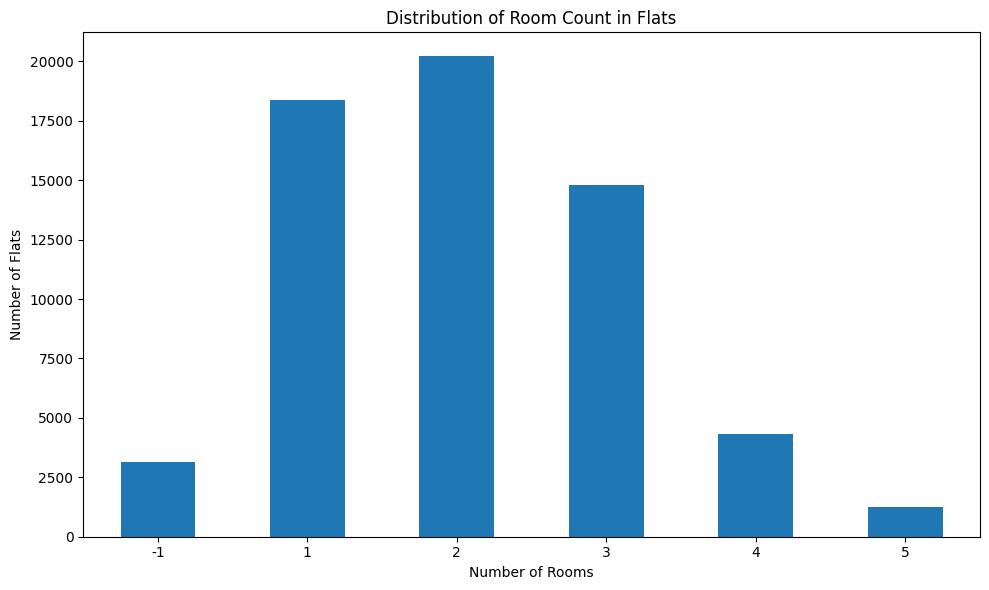

In [ ]:
flats_df = pd.read_csv('flats.csv', sep=',', encoding="utf-8")
plt.figure(figsize=(10, 6))
flats_df['rooms_count'].value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of Room Count in Flats')
plt.xlabel('Number of Rooms')
plt.ylabel('Number of Flats')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

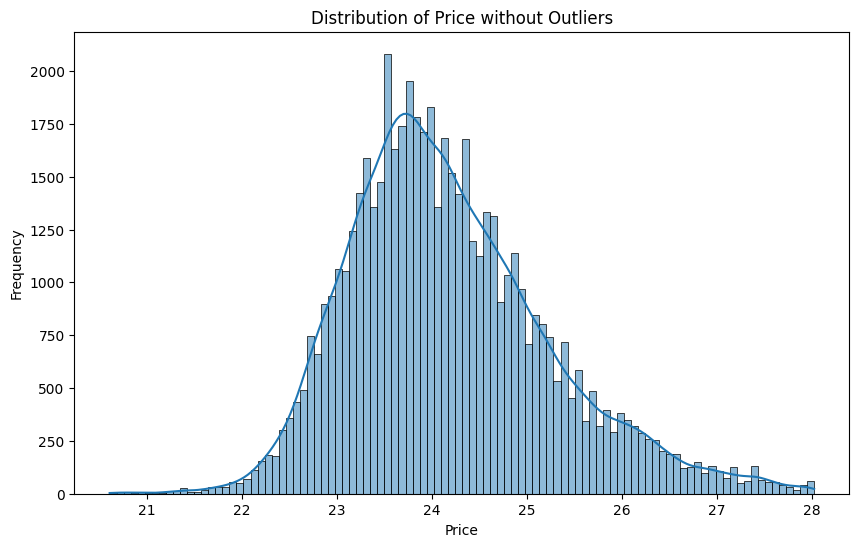

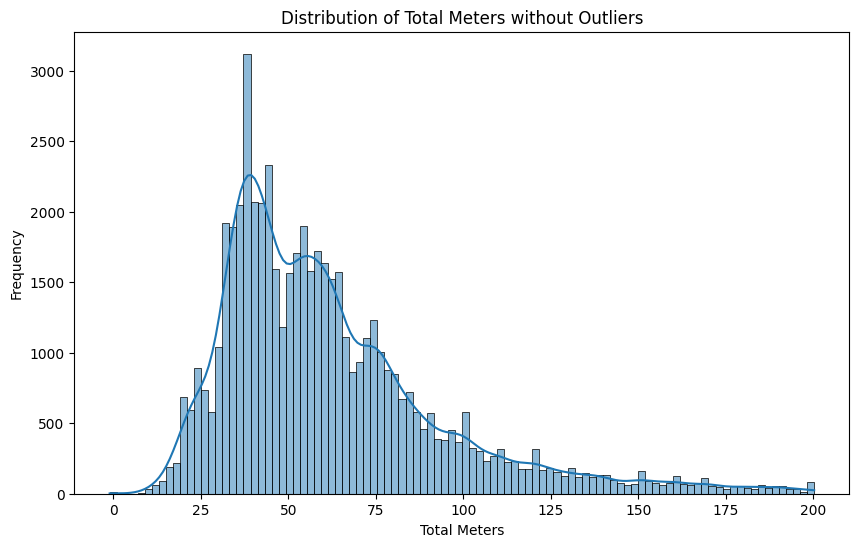

In [ ]:
from scipy import stats
import numpy as np

# Function to remove outliers using z-score
# For this example, we will consider values with a z-score greater than 3 as outliers

def remove_outliers(df, column):
    return df[(np.abs(stats.zscore(df[column])) < 3)]

# Removing outliers from 'price' and 'total_meters'
df_flats_no_outliers = remove_outliers(df, 'price')
df_flats_no_outliers = remove_outliers(df_flats_no_outliers, 'total_meters')

# Visualizing distributions again after removing outliers
plt.figure(figsize=(10, 6))
price_dist_plot_no_outliers = sns.histplot(df_flats_no_outliers['price'], bins=100, kde=True)
price_dist_plot_no_outliers.set_title('Distribution of Price without Outliers')
price_dist_plot_no_outliers.set_xlabel('Price')
price_dist_plot_no_outliers.set_ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
total_meters_dist_plot_no_outliers = sns.histplot(df_flats_no_outliers['total_meters'], bins=100, kde=True)
total_meters_dist_plot_no_outliers.set_title('Distribution of Total Meters without Outliers')
total_meters_dist_plot_no_outliers.set_xlabel('Total Meters')
total_meters_dist_plot_no_outliers.set_ylabel('Frequency')
plt.show()

# Районы с наибольшим количеством квартир

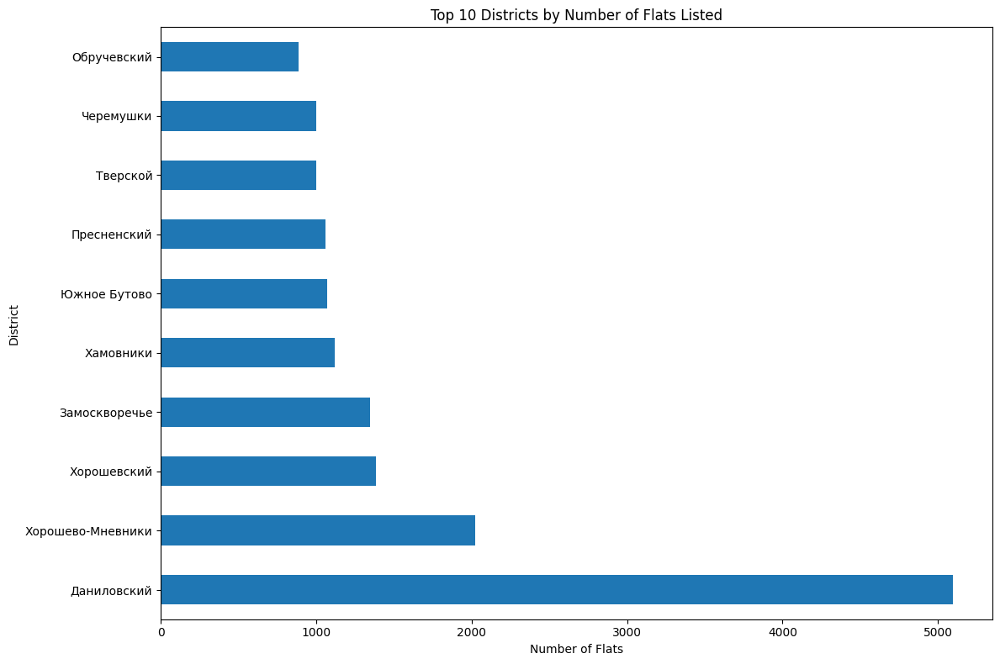

In [ ]:
plt.figure(figsize=(12, 8))
flats_df['district'].value_counts().head(10).plot(kind='barh')
plt.title('Top 10 Districts by Number of Flats Listed')
plt.xlabel('Number of Flats')
plt.ylabel('District')
plt.tight_layout()
plt.show()

<ipython-input-21-1bb37bf47cc1>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr(method='pearson')


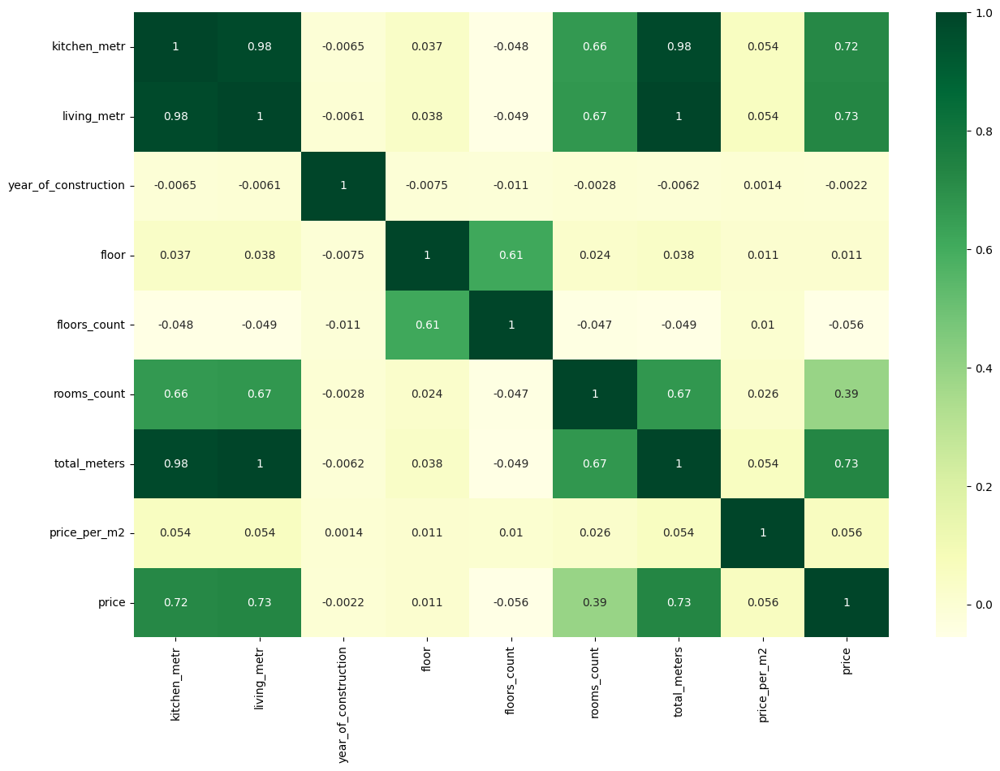

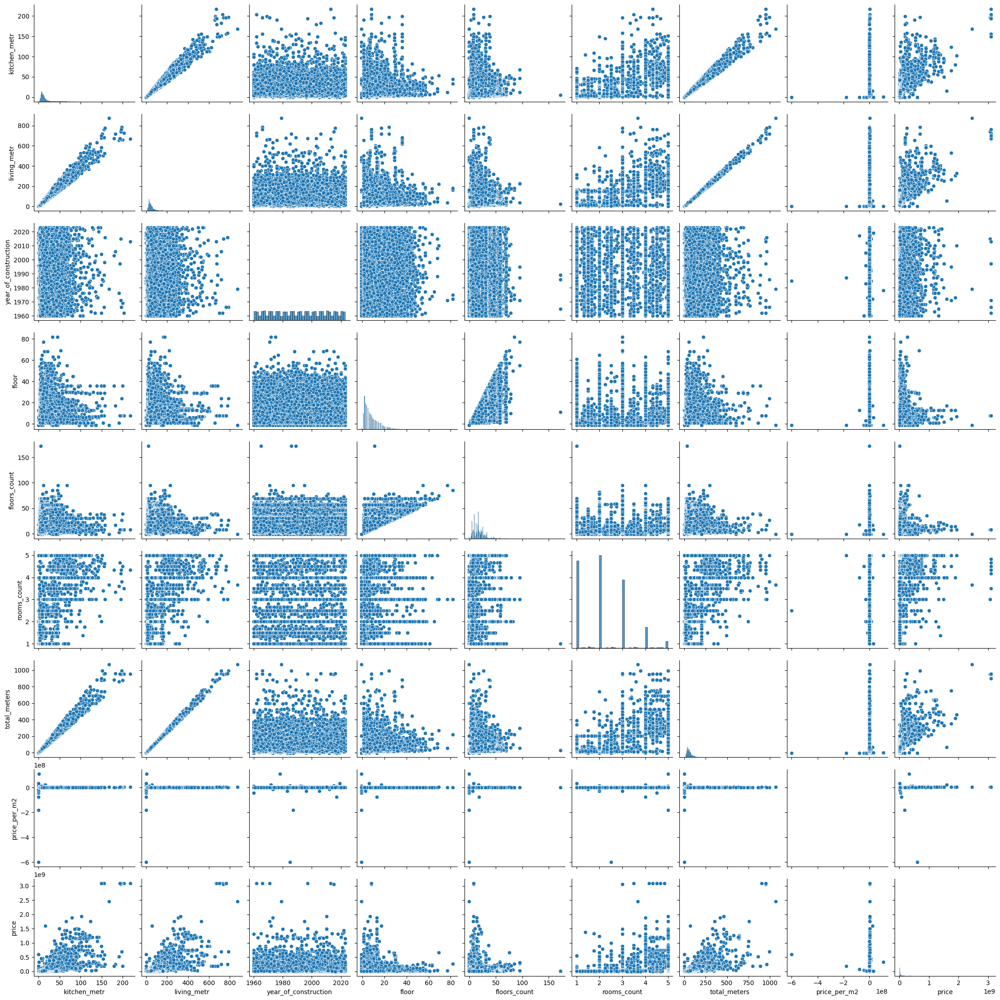

In [ ]:
corr = df.corr(method='pearson')
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot=True, cmap='YlGn')
sns.pairplot(df)

# Смотрим новую корреляцию

<ipython-input-76-1bb37bf47cc1>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr(method='pearson')


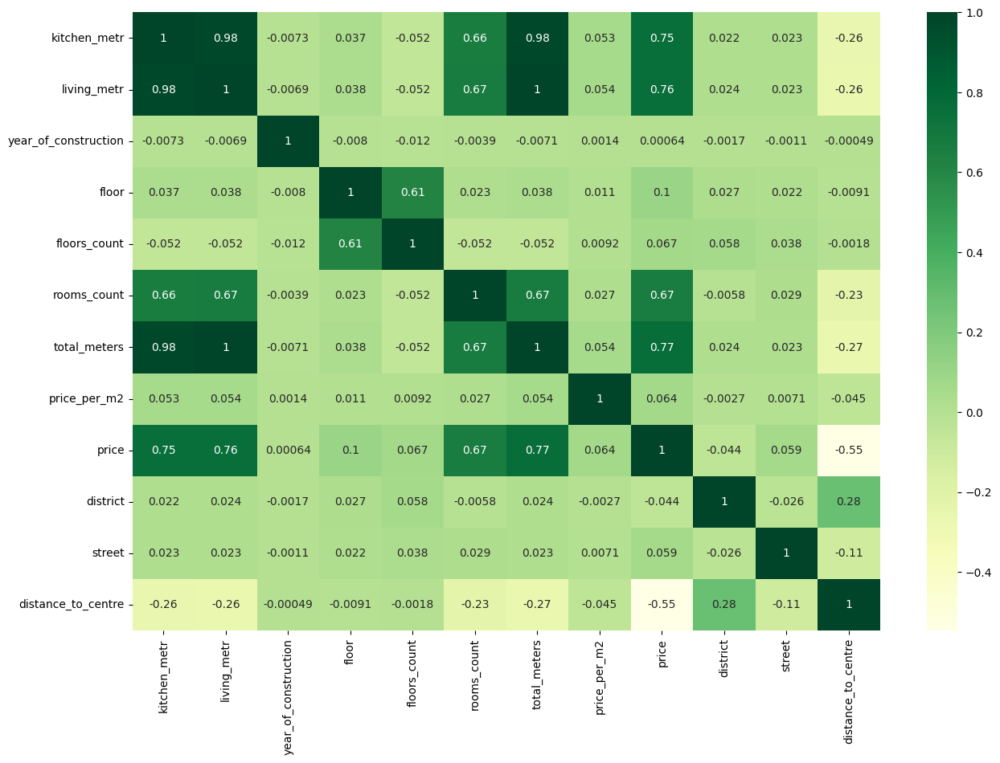

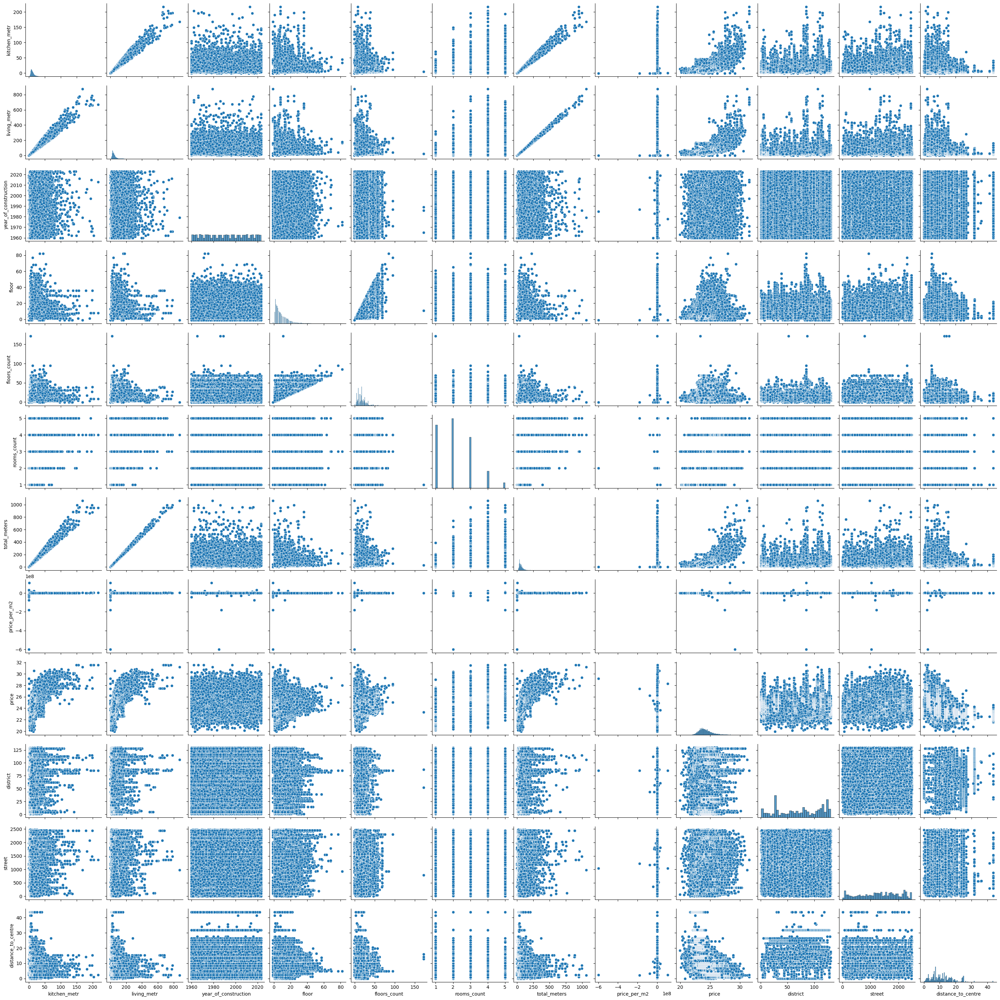

In [ ]:
corr = df.corr(method='pearson')
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot=True, cmap='YlGn')
sns.pairplot(df)

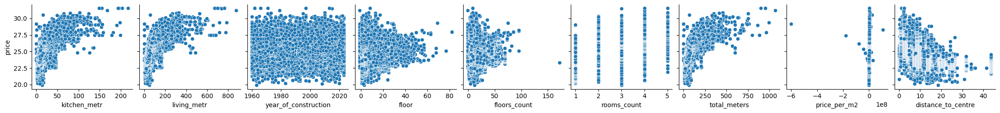

In [ ]:
sns.pairplot(df, y_vars=['price'], x_vars=df.columns.drop(['price', 'district', 'street', 'underground']))
plt.show()

# Обучение

In [ ]:
X = df.drop(columns=["price", "underground", "price_per_m2"])
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [ ]:
X.columns

Index(['kitchen_metr', 'living_metr', 'year_of_construction', 'floor',
       'floors_count', 'rooms_count', 'total_meters', 'district', 'street',
       'distance_to_centre'],
      dtype='object')

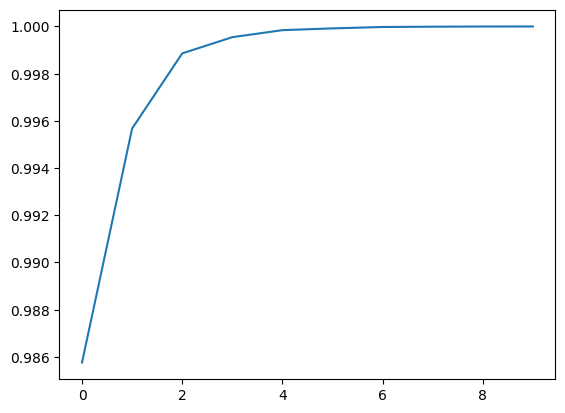

In [ ]:
from sklearn.decomposition import PCA
pca_test = PCA(n_components=X_train.shape[1])
X_train_scaled = X_train
pca_test.fit(X_train_scaled)
plt.plot(np.cumsum(pca_test.explained_variance_ratio_))
plt.show()

In [ ]:
def best_params(models_names):
    """models_names = ['name1', 'name2', ...]
    names from LinearRegression, RandomForestRegressor, KNeighborsRegressor"""

    d = {}

    for model_name in models_names:
        if model_name == 'LinearRegression':
            lin_reg_parameters = {"fit_intercept": [True, False]}
            lin_reg_search = GridSearchCV(LinearRegression(), lin_reg_parameters, cv=5)
            lin_reg_search.fit(X_train, y_train)
            d['LinearRegression'] = lin_reg_search.best_params_
            global lin_reg_search_fitted
            lin_reg_search_fitted = lin_reg_search

        elif model_name == 'RandomForestRegressor':
            rf_reg_parameters = {'n_estimators': range(1, 200), 'max_depth': range(1, 30), 'min_samples_split': range(2, 30), 'min_samples_leaf': range(1, 30)}
            rf_reg_search = RandomizedSearchCV(RandomForestRegressor(), rf_reg_parameters, cv=5, n_jobs=-1, random_state=0)
            rf_reg_search.fit(X_train, y_train)
            d['RandomForestRegressor'] = rf_reg_search.best_params_
            global rf_reg_search_fitted
            rf_reg_search_fitted = rf_reg_search

        elif model_name == 'KNeighborsRegressor':
            kn_reg_parameters = {'n_neighbors': range(3, 10), 'weights': ['uniform', 'distance'], 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'], 'leaf_size': range(1, 40)}
            kn_reg_search = GridSearchCV(KNeighborsRegressor(), kn_reg_parameters, cv=5)
            kn_reg_search.fit(X_test, y_test)
            d['KNeighborsRegressor'] = kn_reg_search.best_params_
            global kn_reg_search_fitted
            kn_reg_search_fitted = kn_reg_search

    return d

In [ ]:
best_params(['LinearRegression', 'RandomForestRegressor', 'KNeighborsRegressor'])

{'LinearRegression': {'fit_intercept': True},
 'RandomForestRegressor': {'n_estimators': 177,
  'min_samples_split': 6,
  'min_samples_leaf': 16,
  'max_depth': 21},
 'KNeighborsRegressor': {'algorithm': 'brute',
  'leaf_size': 1,
  'n_neighbors': 6,
  'weights': 'distance'}}

In [ ]:
def best_model(X_train, y_train, X_test, y_test):
    import re
    models = [LinearRegression(fit_intercept=True, n_jobs=-1),
              RandomForestRegressor(n_estimators=177, min_samples_split=6, min_samples_leaf=16, max_depth=21, n_jobs=-1),
              KNeighborsRegressor(algorithm='brute', leaf_size=1, n_neighbors=6, weights='distance', n_jobs=-1)]
    d = {}
    for model in models:
        model.fit(X_train, y_train)
        model_name = re.match(r'\w+', str(model)).group()
        d[model_name] = r2_score(y_test, model.predict(X_test))
    mdf = pd.DataFrame(d, index=['r2_score:'])

    plt.figure(figsize=(9,5))
    bp = sns.barplot(x=mdf.columns, y=mdf.values.flatten())
    bp.set_xlabel("Models", fontsize=14)
    bp.set_ylabel("R2", fontsize=14)

    best_regression_model = mdf.idxmax(axis=1)[0]
    return ('Best_regression_model: ', best_regression_model, '\n', mdf)

Best_regression_model:  RandomForestRegressor 
            LinearRegression  RandomForestRegressor  KNeighborsRegressor
r2_score:          0.758817               0.904008             0.858878


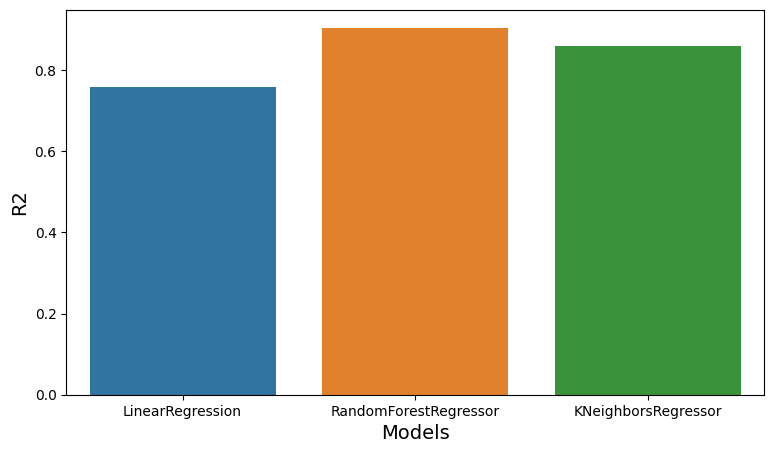

In [ ]:
print(*best_model(X_train, y_train, X_test, y_test))

In [ ]:
rf = RandomForestRegressor(n_estimators=177, min_samples_split=6, min_samples_leaf=16, max_depth=21, n_jobs=-1)
rf.fit(X_train, y_train)
print('R2:', r2_score(y_test, rf.predict(X_test)))

R2: 0.9042785788595327


# Тест

In [ ]:
total_meters = 65
living_metr = 38
kitchen_metr = 17
year_of_construction = 2015
floor = 23
district = "Ростокино"
street = "проспект Мира"
floors_count = 38
distance_to_centre =  14.8
rooms_count = 2

X_flat = [[kitchen_metr, living_metr, year_of_construction, floor, floors_count,
           rooms_count,	total_meters, disctrict_name_mapping[district],
           street_name_mapping[street], distance_to_centre]]
y_pred = rf.predict(X_flat)
print('Recommended price of your flat in RUB:', (2**y_pred[0]).round(1))

Recommended price of your flat in RUB: 23675561.1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
